The goal of this notebook is to evaluate the embeddings that we have created. Specifically, we are interested in how well (both qualitative and quantitatively) our embeddings do at matching questions with context in the statement portion of the earnings call transcript. Since we divided the statements portion of each earnings call transcript into chunks of size at most 64 words, this reduces to matching each question with the statement chunk that is most "similar" in terms of some predefined similarity metric (e.g. cosine similarity).

In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt

In [2]:
# Change this to point to your embeddings
FILE_PATH = 'embeddings/bag_of_words.pickle'

In [3]:
with open(FILE_PATH, 'rb') as f:
    transcript_embeddings = pickle.load(f)

In [4]:
def cosine_sim(u, v):
    u = np.reshape(u, (u.shape[0],))
    v = np.reshape(v, (v.shape[0],))
    return np.dot(u.T, v) / (np.linalg.norm(u) * np.linalg.norm(v))

In [5]:
def jaccard_sim(u, v):
    u = u.toarray()
    v = v.toarray()
    return np.sum(np.minimum(u, v)) / np.sum((u + v))

In [6]:
# Define this as you see fit
sim_func = jaccard_sim

In [7]:
NUM_SAMPLES = len(transcript_embeddings)

In [8]:
q_to_chunk = []
scores = []
for i in range(NUM_SAMPLES):
    curr = {}
    for q_a_idx in range(len(transcript_embeddings[i][1])):
        if transcript_embeddings[i][1][q_a_idx][1] == 1: continue  # This is an answer
        q_embedding = transcript_embeddings[i][1][q_a_idx][0]
        
        curr_best_score, curr_best_chunk = None, None
        for chunk_idx in range(len(transcript_embeddings[i][0])):
            chunk_embedding = transcript_embeddings[i][0][chunk_idx]
            score = sim_func(q_embedding, chunk_embedding)
            
            if curr_best_score is None or score > curr_best_score:
                curr_best_score = score
                curr_best_chunk = chunk_idx
        scores.append(curr_best_score)
        curr[q_a_idx] = curr_best_chunk
    q_to_chunk.append(curr)

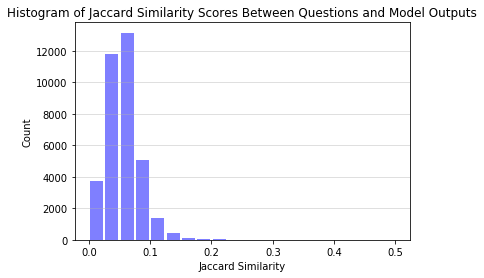

In [9]:
num_bins = 20
n, bins, patches = plt.hist(scores, num_bins, facecolor='blue', alpha=0.5, rwidth=0.85)
plt.grid(axis='y', alpha=0.5)
plt.xlabel('Jaccard Similarity')
plt.ylabel('Count') # Adjust if using Jaccard Similarity
plt.title(r'Histogram of Jaccard Similarity Scores Between Questions and Model Outputs')
plt.show()

In [10]:
# Now we load the original transcripts (only using the training data for now)
with open('data/transcripts_train.pickle', 'rb') as f:
    transcripts = pickle.load(f)

In [12]:
for i, mapping in enumerate(q_to_chunk):
    print(len(mapping.keys()))
    for q_idx in mapping.keys():
        # Special case where an analyst is the last speaker in the Q&A session
        if q_idx == len(transcripts[i][3]) - 1: break
        print("START")
        print(q_idx)
        print ("QUESTION TEXT:\n")
        print(transcripts[i][3][q_idx][0])
        print("\nANSWER TEXT\n")
        print(transcripts[i][3][q_idx + 1][0])
        print("\nMODEL OUTPUT:\n")
        print(transcripts[i][2][mapping[q_idx]] + '\n')
        print('#' * 75)

QUESTION TEXT:

operator instructions first question comes line bruce geller dghm please proceed hi good morning guys

MODEL OUTPUT:

questions please feel free butt ask question want

###########################################################################
QUESTION TEXT:

good thanks glad hear things turned around far current quarter 7 negative comp related 13 weeks versus 14 weeks

MODEL OUTPUT:

concerned jupiter property taking business away rustic inn fort lauderdale 60 miles apart anecdotal history rustic people would travel 100 miles get know customers came far came far palm beach rustic fort lauderdale jupiter think given jupiter property moving right direction still losses good move company made transaction first quarter new fiscal year also first quarter new fiscal year continue expansion owning properties bought

###########################################################################
QUESTION TEXT:

got okay kind go trends market also extent provide framework coming y


###########################################################################
QUESTION TEXT:

next question noelle dilts stifel please go ahead

MODEL OUTPUT:

good morning welcome azz incorporated third quarter 2017 financial results conference call operator instructions please also note today event recorded would like turn conference joe dorame lytham partners please go ahead

###########################################################################
QUESTION TEXT:

hi given upcoming change administration give us thoughts see major trump infrastructure move forward think might exposure thoughts might proposed deregulation even tax would interesting

MODEL OUTPUT:

thanks paul summarize believe capability within azz perform better execute strategic initiatives positioning us leader infrastructure protection focused lot great things terms organization development training improving talented bench setting grow great growth initiatives underway committed driving faster effectively genera

volumes order book value billion slightly 2015 principally due lower order book central london business result high level completions higher price points month december rest country continuing benefit sustained good demand private average selling prices 13 total average selling price business 11 2015 benefiting mix market driven inflation sales rate year marginally 2015 continued low level cancellations saw course year looking land land market

###########################################################################
QUESTION TEXT:

okay great thank much next question charlie campbell liberum please go ahead got three may please real quite quick sort land creditors wondering movement speak help us understand cash position secondly margin 2016 sort 50 basis points wondering could help us sort underlying build cost inflation underlying selling price inflation 2016 understand clearly got mix shifts going lastly obviously sort quite topical point given sort press today could remind us sa


across many businesses asset classes billion deconsolidation reverse mortgage loans reduced growth rate family first mortgage loan portfolio highlighted page 13 record trillion average deposits fourth quarter billion 6 year ago growth commercial consumer deposits consumer small business banking deposits increased 8 year ago average deposit cost increased four basis points year ago driven commercial deposit pricing little market response rate hike december 2015

###########################################################################
QUESTION TEXT:

next question comes line erika najarian bank america please go ahead wanted get clarification response ken question think reduction expenses investing back 2018 mean expense base absolute basis could potentially flattish 2018 simplistic think really think revenue side well trying think whether think 2 billion something investments 2018 really going back 55 59 efficiency ratio guidance

MODEL OUTPUT:

quarter turning income statement over


MODEL OUTPUT:

thank larry unitedhealthcare also enters 2017 strong momentum fourth quarter full year 2016 revenues well balanced growing percentages every product category medical cost remained well managed commercial medical cost trend ending year line expectations approximately 6 2016 one strongest organic growth years history 2 million members joining unitedhealthcare continues build well diversified growth momentum customers consumer retention rates continue improve broadly notable strength small

###########################################################################
QUESTION TEXT:

take next question lance wilkes sanford bernstein please go ahead yeah question pbm margins wanted know couple points one saw improvement quarter much mergers synergies much look 2017 merger synergy plan related would sort trends seeing manufacturers rebates cost side trends like client side look margins

MODEL OUTPUT:

live healthier lives help make health system work better everyone today see o


MODEL OUTPUT:

sng increased contribution tgp expansion projects placed service largely offsets lower midstream volumes co2 decreased approximately 54 million due lower oil price approximately 8 lower production steve mentioned lower production partially driven project deferrals well reallocating capital higher return projects slower production response terminals segment 39 million 15 driven increased contributions jones act tankers joint venture bp products 19 impacted higher volumes kmcc double

###########################################################################
QUESTION TEXT:

okay last question kim quick housekeeping one 215 million impairment equity investment ruby recognizing obviously nature quantify us maybe magnitude timing shift west coast natural gas demand drove impairment recognized trying get sense drivers behind

MODEL OUTPUT:

investment ruby although majority ruby capacity contracted 2021 impairment driven delay expected west coast natural gas demand timeframe

okay thank go next frank schiraldi sandler neil good morning

MODEL OUTPUT:

good morning ladies gentlemen welcome fulton financial fourth quarter results conference call call recorded would like turn call jason weber please go ahead sir

###########################################################################
QUESTION TEXT:

couple guess mortgage banking front phil think mentioned better mix purchase indiscernible breakout terms business

MODEL OUTPUT:

like turn call phil rohrbaugh discuss financial performance detail

###########################################################################
QUESTION TEXT:

okay fair say given mean highlighted drivers fee income growth 2017 fair say mortgage banking business expect grow maybe could grow somewhere mid high single digit rate expect fee income grow total given drivers

MODEL OUTPUT:

increased added loan originators across footprint 2016 continue actively hire loan originators 2017 despite projected rising rate environment projecte

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





MODEL OUTPUT:

growth grew expected quarter highlights quarter greater detail numbers like turn call chief financial officer peter chapman pete

###########################################################################
QUESTION TEXT:

right helpful thank much next question comes jon arfstrom rbc capital markets please go ahead thanks good morning

MODEL OUTPUT:

good morning welcome great western bancorp first quarter fiscal year 2017 earnings announcement conference call participants mode operator instructions today presentation opportunity ask questions operator instructions please note event recorded would like turn conference ann nachtigal director corporate communications great western bancorp please go ahead

###########################################################################
QUESTION TEXT:

couple questions steve talked discontinuing ag relationships weaker borrowers magnitude

MODEL OUTPUT:

seen quarter steve

#######################################################

got okay thank much next question comes line savi syth raymond james hey good morning could wondering cost side able kind breakout 1q 2017 much pressure coming wages line wages line well progression mean fourth quarter get kind flattish levels kind curious progression throughout quarters

MODEL OUTPUT:

thank marty robin good morning everybody thanks joining us morning reported fourth quarter 2016 operating income 296 million income quarter 274 million operating margin 18 margin points points respectively anticipated fourth quarter saw acceleration unit cost trends capacity growth slowed excluding fuel profit sharing unit costs increased line fourth quarter guidance range growth ended year approximately 970 million cash investments fourth quarter made scheduled

###########################################################################
QUESTION TEXT:

helpful jim stage length comment mean wonder could kind help understand much going drag earnings drags cost also maybe kind benefit mig


right thanks much

MODEL OUTPUT:

total capital raise coming retail great expectations ability continue growing initiative across investment platforms around world conclusion looking forward envision excellent prospects next several years firm limited partners business flexible responsive changing dynamics ideal period entering unitholders coming period record fundraising significant investment activity powerful earnings trajectory michael chae describe detail thanks lot investing us michael

###########################################################################
QUESTION TEXT:

next question comes craig siegenthaler credit suisse please proceed thanks good morning infrastructure segment could represent large profit opportunity blackstone logical extension teams products managing wondering plans raise funds infrastructure space working

MODEL OUTPUT:

good day ladies gentlemen welcome blackstone fourth quarter full year 2016 investor call name mark operator today time participants

QUESTION TEXT:

okay yes answered question thank gary take next question helane becker cowen company thanks operator hi team thanks taking time couple questions one international possible break revenue actual asms opposed reporting one group

MODEL OUTPUT:

questions possible time turn call gary

###########################################################################
QUESTION TEXT:

point get big enough broken even annual report

MODEL OUTPUT:

points growth domestic capacity growth moderated 2016 levels highs 5 6 levels line gdp wanted point ltcs growing low first half 2017 said keep mind small part base closing wanted thank employees tremendous quarter tremendous ca thank enough outstanding customer service overview turn tom ready take questions

###########################################################################
QUESTION TEXT:

okay question unrelated maintenance cost clients fourth quarter something happen fourth quarter cost much accelerated retirement classics expect 

###########################################################################
QUESTION TEXT:

perfect thank

MODEL OUTPUT:

thank jonathan welcome everyone maxim integrated fiscal second quarter 2017 earnings conference call call today chief executive officer tunc doluca chief financial officer bruce kiddoo would like highlight posted supplemental financial presentation external investor relations website information presentation accompanies financial disclosures earnings press release conference call today call making statements light private securities litigation reform act like remind statements must considered conjunction cautionary warnings

###########################################################################
QUESTION TEXT:

thank next question comes line blayne curtis barclays question please hi thank jerry zhang ph wanted ask expect infra next wondering sustainable see rebound coming kind expected weakness december talked last call longs continue thank

MODEL OUTPUT:

thank

###########################################################################
QUESTION TEXT:

good thank much go next paul ridzon keybanc good morning congratulations

MODEL OUTPUT:

good day everyone welcome nextera energy nextera energy partners fourth quarter 2016 earnings conference call today conference recorded time opening remarks would like turn conference amanda finnis director investor relations please go ahead

###########################################################################
QUESTION TEXT:

detail question fpl fourth quarter pretty poor weather hurricane yet still able reverse reserve amortization maintain trailing 12 roe kind happened

MODEL OUTPUT:

greenhouse gas emitting power plants state also providing customer savings fpsc approved indiantown transaction last fall closed acquisition first week january reported roe regulatory purposes 12 months ended december 2016 ended third quarter 2016 reserve amortization balance 230 million added 20 million fourth quarter

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



###########################################################################
QUESTION TEXT:

great thank

MODEL OUTPUT:

ladies gentlemen thank standing welcome omam earnings conference call webcast fourth quarter full year 2016 call participants mode presentation conduct session operator instructions please note call recorded today february 2 eastern time would like turn meeting brett perryman head investor relations please go ahead brett

###########################################################################
QUESTION TEXT:

finally ask please limit one question one however may place back queue another question one moment please first question first question comes justin lake wolfe research may ask question thanks good morning couple questions first recent communications anthem deal appear indicate might agree partner right extend curious give us color recent comments via also curious reason particular given color capital deployment plan b scenario given partner deal done already



###########################################################################
QUESTION TEXT:

first question coming line deane dray rbc

MODEL OUTPUT:

110 increased dividend shareholders 10 last year consistent commitment return capital shareholders line earnings cash flow growth today announced increase dividend 16 turn mark details results

###########################################################################
QUESTION TEXT:

dray go ahead

MODEL OUTPUT:

thanks mark overall pleased team strong execution global market looking ahead expect acquired businesses catalysts accelerating revenue profitability earnings growth coupled ongoing commitment continuous improvement business simplification efforts positions us well outperformance operator open questions

###########################################################################
QUESTION TEXT:

okay sorry hey hope could start tone municipal market geography start obviously tough comps still feel spending cycle utilities started

strong trends group business turning annuities posted strong operating results fourth quarter power business overcame challenging year variable annuity sales though would note sales largely stabilized recent quarters continue expect long term growth annuity marketplace given demographic trends fraying traditional government corporate safety nets noted front adjusting taking place market driven shift consumer preferences importantly many trends ones address actually see opportunity expand distribution

###########################################################################
QUESTION TEXT:

broad level statistics terms percent va sales frontload commission know different structures broadly frontload versus level fee understanding industry standpoint vast preponderance sales frontload curious case think evolution industry make big move direction see kind longer transition period move direction

MODEL OUTPUT:

slightly lastly strong returns expected new business returns achieving target


hello welcome cbl associates properties fourth quarter earnings conference call participants mode operator instructions please note event recorded would like turn conference scott brittain corporate communications please go ahead

###########################################################################
QUESTION TEXT:

next question comes michael mueller jpmorgan please go ahead hi couple hopefully quick ones trying understand 8 million 10 million 10 million impact year trying figure run rate already incremental think said 3 million impact last year half impact would six get another 2 million mentioned 2017 right way think point going forward really 2 million annualized marginal impact two four right way

MODEL OUTPUT:

achieved excellent pricing transaction 5 7 cap rate range g full year inline guidance range million net litigation expense fees represents revenues compared noi portfolio increased 30 basis points bringing full year growth said previously anticipated fourth quarter n


MODEL OUTPUT:

good day ladies gentlemen welcome today chipotle mexican grill fourth quarter 2016 earnings conference call today conference recorded time like turn floor mark alexee investor relations manager chipotle mexican grill please go ahead sir

###########################################################################
QUESTION TEXT:

thanks helpful appreciate

MODEL OUTPUT:

operating efficiencies make us optimistic accomplish despite challenges never lost sight purpose made chipotle compelling brand compelling company exciting time us chipotle look forward team going accomplish year thanks time today like open lines questions

###########################################################################
QUESTION TEXT:

next question comes karen holthouse goldman sachs hi thank taking questions looking sort unit unit initiatives better manage cost sales labor sort difference success rate stores might seeing versus kind less volatile sales trends

MODEL OUTPUT:

reducing waste o

okay thank next question comes justin long stephens please go ahead thanks good afternoon congrats quarter obviously saw substantial pick brokerage quarter wondering could give us sense much growth brokerage related looking ahead could provide little bit color expectations truck brokerage revenue margin perspective 2017

MODEL OUTPUT:

thanks hello everyone would like highlight three points first truck brokerage growth saw beginning quarter continued resulting impressive 40 increase gross margins second intermodal business exceeded expectations strength retail sales operational efficiency third hub segment revenue growth 13 resulted diversified services approach key numbers fourth quarter hub group revenue increased 10 979 million hub group diluted earnings per share compared last year discuss details

###########################################################################
QUESTION TEXT:

great helpful terri maybe one clarification comment truck brokerage margins could maybe talk e

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





MODEL OUTPUT:

payment acceptance drive improved performance quarter made progress acquiring new customers helping existing customers go 100 toward expanding value connections like discuss initiatives momentarily significant new set new customers added recently group six pepsi bottlers north south carolina rolling combination eport interactive eport g9 devices connected eport connect service total units believe continuation increasing adoption cashless payment solutions unattended retail addition pepsi bottlers relationship

###########################################################################
QUESTION TEXT:

volumes talked know percent cashless get six bottlers

MODEL OUTPUT:

payment acceptance drive improved performance quarter made progress acquiring new customers helping existing customers go 100 toward expanding value connections like discuss initiatives momentarily significant new set new customers added recently group six pepsi bottlers north south carolina rolling comb

thank much next question come john freeman raymond james please go ahead good morning guys

MODEL OUTPUT:

commission time opening remarks would like turn call pioneer senior vice president investor relations frank hopkins please go ahead sir

###########################################################################
QUESTION TEXT:

looking current plan going operate six seven pressure pumping fleets year plan get beyond seven utilize potentially consider expanding fleet

MODEL OUTPUT:

prosecuting many years ahead us becoming bigger exporter glad export ban lifted pretty clear look forward pioneer rest domestic industry significant swing producers terms worldwide supply toward end exporting two barrel cargoes asia next couple weeks beginning period seeing export becoming important part goals going forward summary 2016 simply outstanding year accomplishments operational financial standpoint turning slide 5 looking forward year plan year capital

#######################################


okay curious know forecast estimate terms impact q1 transaction would earnings basis

MODEL OUTPUT:

strategy remains unchanged remain financially flexible order support growth development underlying assets without extent possible rely capital markets valener also seeks pay majority available cash flow sustainable manner means cash flow excluding impact item irregular events concludes call operator open line questions

###########################################################################
QUESTION TEXT:

talk detail would growth come primarily residential small commercial

MODEL OUTPUT:

month last december acquired partners 50 interest cdh joint venture making us sole owners asset extension ccum ccum offers district heating cooling network meet needs many landmark commercial buildings residential condominiums downtown montréal thought timing right us take back control strategic energy asset located right backyard benefiting contracts financially strong customers base scenario ac

QUESTION TEXT:

got think got maybe related commentary ongoing piece understand piece know sort highlighting guys highlighting calculation around financing documents service agreement probably referring sequential talk little bit agreement still supporting partner revenue flow continuing ops going forward 32 million annual agreement thrown discontinuing ops wo worry

MODEL OUTPUT:

operations million high end original guidance 122 million 125 million cloud services fourth quarter consisted personal cloud cloud analytics related revenue highlighted past conference calls roughly billion subscribers around world platform major potential growth opportunity around mining analyzing data customers small today cloud analytics solution started razorsight acquisition blossomed organic innovative r initiatives past 18 months also believe exiting traditional activation software service business

###########################################################################
QUESTION TEXT:

okay explai

###########################################################################
QUESTION TEXT:

okay appreciate response wanted ability correct meaningful way traffic declines call roughly 200 basis points past year something still going take time infer previous comments forth fair critique

MODEL OUTPUT:

financial measures mentioned today call corresponding gaap measures reminder fiscal 2016 year dunkin brands referring results guidance targets basis turn call nigel travis

###########################################################################
QUESTION TEXT:

last question comes line matthew difrisco guggenheim line open thank appreciate second question respect think heard call guys mention percent sales done mobile order pay curious potentially streamlining also benefit might help unleash maybe even greater mobile order pay would maybe potentially call bottleneck problem stores curious back minds also test 200 stores 300 stores

MODEL OUTPUT:

particularly food side 300 stores acro

###########################################################################
QUESTION TEXT:

next question comes steve powers ubs line open congratulations well following bryan question price mix great price mix quarter like q4 guess question mind seeing bottom line vacuum think 5 6 points pricing mix would significantly margin accretive guess case maybe revenue line actually margin even penny profit dilutive bottom line thinking really structural shift sparkling stills perhaps packaging changes geographic shifts balance overall business may play role well talked seeing profit price mix

MODEL OUTPUT:

look core business important indicator longer term trajectory top line remained encourage growing core line revenue target even bottom end finally expanded operating margin strong price mix balancing 600 million productivity disciplined investments given overall 2016 actions enabled us grow comparable currency neutral structural income tax 8 target range laid beginning year texture 2016 t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



###########################################################################
QUESTION TEXT:

great thank appreciate go next question mark miller benchmark company let add congratulations record results wondering could give sort feeling terms growth opportunities share gain opportunities couple areas china 200 millimeter advanced node also foundry think best growth opportunity best share gain opportunity missed one add

MODEL OUTPUT:

revenues extend even ramp several memory nodes made significant progress memory also continue strengthen momentum broader foundry markets beside growing delivery leading edge nodes 10 nanometer 7 nanometer also extended deliveries 28 nanometer top fueled ph growing demand iot connected devices foundry revenues grew 10 sequentially higher foundry wafer fab equipment growth amplify share gain achievement multiple customers including growing position china specifically year

###########################################################################
QUESTION T